##### This Complete project is about the Wall and Ceiling Segmentation by using the pre-trained model of YOLO model

In [ ]:
# pip install ultralytics==8.3.15  # Latest Ultralytics for YOLOv11 okay
# pip install opencv-python==4.10.0.84  # For image processing   okay
# pip install numpy==1.26.4  # For array operations okay
# pip install albumentations==1.4.18  # For data augmentation okay
# pip install tensorflow==2.17.0  # For TFLite conversion okay
# pip install matplotlib==3.9.2  # For visualization 
# pip install pyyaml==6.0.2  # For YAML configuration

In [1]:
# !pip install tensorflow==2.11.0 opencv-python numpy albumentations matplotlib

python version 3.10.11

In [1]:
!pip show keras

Name: keras
Version: 3.10.0
Summary: Multi-backend Keras
Home-page: 
Author: 
Author-email: Keras team <keras-users@googlegroups.com>
License: Apache License 2.0
Location: E:\YOLO Model\venv\Lib\site-packages
Requires: absl-py, h5py, ml-dtypes, namex, numpy, optree, packaging, rich
Required-by: tensorflow-intel


In [2]:
import tensorflow as tf
print(tf.__version__)

2.17.0


In [3]:
import tensorflow as tf
from tensorflow.keras.utils import to_categorical, register_keras_serializable
print("TensorFlow version:", tf.__version__)
print("Keras imports successful!")

TensorFlow version: 2.17.0
Keras imports successful!


In [4]:
#%% Cell 1: Imports and Setup 
import os
import cv2
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical, register_keras_serializable
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, BatchNormalization, Conv2DTranspose, Activation, Multiply, Concatenate, Add, MaxPooling2D, GlobalAveragePooling2D, Reshape, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.metrics import MeanIoU
import albumentations as A
import matplotlib.pyplot as plt

# Test imports 
print('TensorFlow version:', tf.__version__)
print('All imports successful!')

TensorFlow version: 2.17.0
All imports successful!


e:\YOLO Model\venv\Lib\site-packages\albumentations\__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.18). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [5]:
# Define dataset paths
train_images_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\train\\\\images'
train_annotations_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\train\\\\annotations'
train_masks_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\train\\\\masks'
val_images_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\validation\\\\images'
val_annotations_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\validation\\\\annotations'
val_masks_dir = 'E:\\\\YOLO Model\\\\Annotated_Dataset - Copy\\\\validation\\\\masks'
    
# Create masks directories if they don't exist 
os.makedirs(train_masks_dir, exist_ok=True)
os.makedirs(val_masks_dir, exist_ok=True)

In [8]:
#%% Cell: Corrected Mask Generation
import os
import cv2
import json
import numpy as np

def load_mask_from_json(mask_json_path, height, width):
    try:
        with open(mask_json_path, 'r') as f:
            mask_data = json.load(f)
        mask = np.zeros((height, width), dtype=np.uint8)
        shapes = mask_data.get('shapes', [])
        if not shapes:
            print(f"Warning: No shapes found in {mask_json_path}")
            return mask  # Return empty mask if no shapes
        for shape in shapes:
            label = shape.get('label', '').lower()
            points = np.array(shape.get('points', []), dtype=np.int32)
            if len(points) < 3:  # Polygons need at least 3 points
                print(f"Warning: Invalid points for shape {label} in {mask_json_path}")
                continue
            if label == 'wall':
                color = 1
            elif label == 'ceiling':
                color = 2
            else:
                color = 0
            if len(points.shape) == 1:
                points = points.reshape((-1, 2))
            cv2.fillPoly(mask, [points], color=color)
        return mask
    except Exception as e:
        print(f"Error processing {mask_json_path}: {e}")
        return np.zeros((height, width), dtype=np.uint8)  # Return empty mask on error

def create_mask_png(mask_json_path, mask_output_path, height, width):
    mask = load_mask_from_json(mask_json_path, height, width)
    if mask is None or mask.size == 0:
        print(f"Error: Empty mask generated for {mask_json_path}")
        return
    cv2.imwrite(mask_output_path, mask)

def generate_masks(images_dir, annotations_dir, masks_dir):
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    os.makedirs(masks_dir, exist_ok=True)
    for img_file in image_files:
        img_base = os.path.splitext(img_file)[0]
        mask_json_path = os.path.join(annotations_dir, img_base + '.json')
        mask_output_path = os.path.join(masks_dir, img_base + '.png')
        img_path = os.path.join(images_dir, img_file)
        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Image {img_path} could not be read. Skipping.")
            continue
        height, width = image.shape[:2]
        if not os.path.exists(mask_json_path):
            print(f"Warning: Annotation JSON {mask_json_path} not found. Skipping.")
            continue
        create_mask_png(mask_json_path, mask_output_path, height, width)
    print(f"Mask generation for {images_dir} completed.")

# Define paths (as provided)
train_images_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\train\\images'
train_annotations_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\train\\annotations'
train_masks_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\train\\masks'
val_images_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\validation\\images'
val_annotations_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\validation\\annotations'
val_masks_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\validation\\masks'

# Generate masks
generate_masks(train_images_dir, train_annotations_dir, train_masks_dir)
generate_masks(val_images_dir, val_annotations_dir, val_masks_dir)

Mask generation for E:\YOLO Model\Annotated_Dataset - Copy\train\images completed.
Mask generation for E:\YOLO Model\Annotated_Dataset - Copy\validation\images completed.


In [9]:
# Cell 3: Data Augmentation 
def augment_data(image_path, mask_path, output_image_path, output_mask_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f'Error: Could not read image {image_path}')
        return
    height, width = image.shape[:2]
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f'Error: Could not read mask {mask_path}')
        return
    transform = A.Compose([
                A.RandomBrightnessContrast(p=0.5),
                A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
                A.GaussianBlur(blur_limit=(3, 7), p=0.3),
                A.HorizontalFlip(p=0.5),
                A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),
                A.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0), p=0.5),
                A.CoarseDropout(max_holes=8, max_height=32, max_width=32, p=0.4)
            ])
    augmented = transform(image=image, mask=mask)
    cv2.imwrite(output_image_path, augmented['image'])
    cv2.imwrite(output_mask_path, augmented['mask'])
        
def augment_dataset(images_dir, masks_dir, output_dir):
    augmented_images_dir = os.path.join(output_dir, 'images')
    augmented_masks_dir = os.path.join(output_dir, 'masks')
    os.makedirs(augmented_images_dir, exist_ok=True)
    os.makedirs(augmented_masks_dir, exist_ok=True)
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for img_file in image_files:
        image_path = os.path.join(images_dir, img_file)
        mask_path = os.path.join(masks_dir, os.path.splitext(img_file)[0] + '.png')
        output_image_path = os.path.join(augmented_images_dir, img_file)
        output_mask_path = os.path.join(augmented_masks_dir, os.path.splitext(img_file)[0] + '.png')
        if not os.path.exists(mask_path):
            print(f'Warning: Mask PNG {mask_path} not found. Skipping augmentation for {img_file}.')
            continue
        augment_data(image_path, mask_path, output_image_path, output_mask_path)
        print('Data augmentation completed and saved.')
    
augment_dataset(train_images_dir, train_masks_dir, os.path.join(train_images_dir, 'augmented'))

C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_15144\748862491.py:17: UserWarning: Argument 'shift_limit' is not valid and will be ignored.
  A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),
C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_15144\748862491.py:17: UserWarning: Argument 'scale_limit' is not valid and will be ignored.
  A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),
C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_15144\748862491.py:17: UserWarning: Argument 'rotate_limit' is not valid and will be ignored.
  A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),


Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation completed and saved.
Data augmentation complet

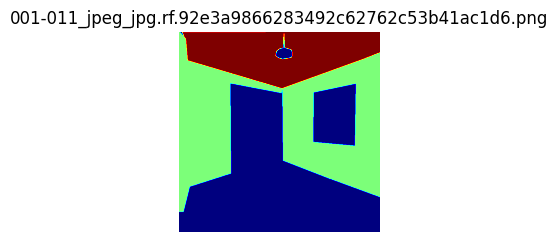

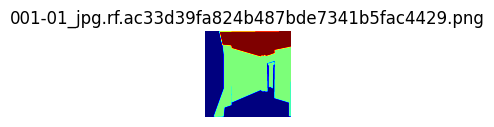

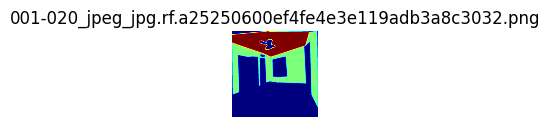

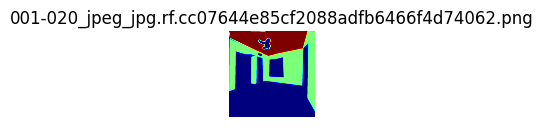

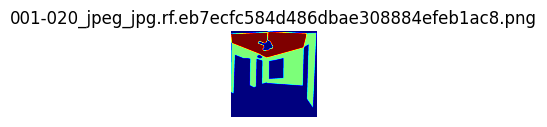

...

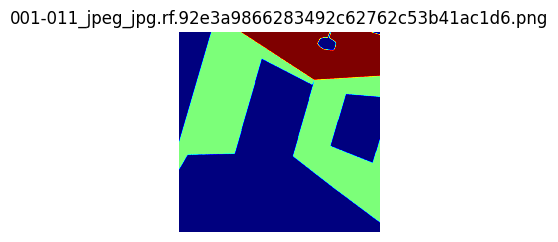

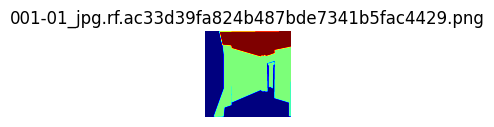

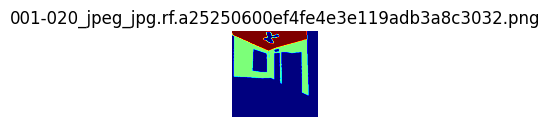

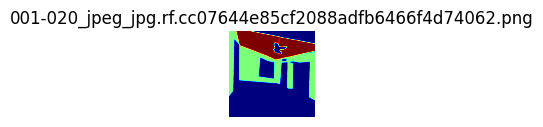

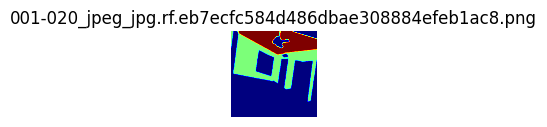

In [10]:
# Cell 4: Visualize Masks 
def visualize_masks(masks_dir, num_samples=5):
    mask_files = [f for f in os.listdir(masks_dir) if f.lower().endswith('.png')]
    plt.figure(figsize=(15, 5))
    for i, mask_file in enumerate(mask_files[:num_samples]):
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f'Could not load mask {mask_file}')
            continue
        plt.subplot(1, num_samples, i+1)
        plt.imshow(mask, cmap='jet')
        plt.title(mask_file)
        plt.axis('off')
        plt.show()
        
visualize_masks(train_masks_dir)
visualize_masks(val_masks_dir)
augmented_train_masks_dir = os.path.join(train_images_dir, 'augmented', 'masks')
visualize_masks(augmented_train_masks_dir)

In [ ]:
# !pip show tensorflow keras segmentation-models


Name: tensorflow
Version: 2.11.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: e:\wall_segmentation_project\.venv\lib\site-packages
Requires: tensorflow-intel
Required-by: 
---
Name: keras
Version: 2.11.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: e:\wall_segmentation_project\.venv\lib\site-packages
Requires: 
Required-by: tensorflow-intel


In [13]:

#%% Cell 5: Custom YOLOv11-Inspired Model
@register_keras_serializable()
class SpatialDropout2D(tf.keras.layers.Layer):
    def __init__(self, rate, **kwargs):
        super(SpatialDropout2D, self).__init__(**kwargs)
        self.rate = rate
        
    def call(self, inputs, training=None):
        if training:
            return tf.nn.dropout(inputs, rate=self.rate, noise_shape=[tf.shape(inputs)[0], 1, 1, tf.shape(inputs)[3]])
        return inputs
        
    def get_config(self):
        config = super(SpatialDropout2D, self).get_config()
        config.update({'rate': self.rate})
        return config
        
@register_keras_serializable()
class ChannelAttention(tf.keras.layers.Layer):
    def __init__(self, ratio=8, **kwargs):
        super(ChannelAttention, self).__init__(**kwargs)
        self.ratio = ratio
    
    def build(self, input_shape):
        channel = input_shape[-1]
        self.shared_layer_one = Dense(channel // self.ratio, activation='relu')
        self.shared_layer_two = Dense(channel, activation='sigmoid')
        
    def call(self, inputs):
        avg_pool = GlobalAveragePooling2D()(inputs)
        avg_pool = Reshape((1, 1, inputs.shape[-1]))(avg_pool)
        avg_pool = self.shared_layer_one(avg_pool)
        avg_pool = self.shared_layer_two(avg_pool)
        return Multiply()([inputs, avg_pool])
        
    def get_config(self):
        config = super(ChannelAttention, self).get_config()
        config.update({'ratio': self.ratio})
        return config
        
def create_yolo_inspired_model(input_shape, num_classes):
    base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    low_level_features = base_model.get_layer('block_3_expand_relu').output  # (None, 64, 64, 144)
    mid_level_features = base_model.get_layer('block_6_expand_relu').output  # (None, 32, 32, 192)
    high_level_features = base_model.get_layer('block_13_expand_relu').output  # (None, 16, 16, 576)
        
            # Simplified SPP-like block (inspired by YOLO's SPPF)\n",
    def spp_block(input_tensor):
        pool1 = MaxPooling2D(pool_size=(5, 5), strides=1, padding='same')(input_tensor)
        pool2 = MaxPooling2D(pool_size=(9, 9), strides=1, padding='same')(input_tensor)
        pool3 = MaxPooling2D(pool_size=(13, 13), strides=1, padding='same')(input_tensor)
        conv = Conv2D(256, (1, 1), padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor)
        return Concatenate()([input_tensor, pool1, pool2, pool3, conv])  # (None, 16, 16, 2560)
        
            # Simplified C3-like block (convolution + residual)\n",
    def c3_block(input_tensor, filters):
        x = Conv2D(filters, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor)
        x = BatchNormalization()(x)
        x = Conv2D(filters, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(x)
        x = BatchNormalization()(x)
    # Adjust input_tensor channels to match x
        input_adjusted = Conv2D(filters, (1, 1), padding='same', kernel_regularizer=l2(0.001))(input_tensor)
        input_adjusted = BatchNormalization()(input_adjusted)
        x = Add()([input_adjusted, x])
        return x
        
    x = spp_block(high_level_features)  # (None, 16, 16, 2560)
    x = ChannelAttention()(x)
    x = c3_block(x, 256)  # (None, 16, 16, 256)
    x = Conv2DTranspose(128, (3, 3), strides=2, padding='same')(x)  # (None, 32, 32, 128)
    x = Concatenate()([x, mid_level_features])  # (None, 32, 32, 128+192=320)
    x = c3_block(x, 128)  # (None, 32, 32, 128)
    x = Conv2DTranspose(64, (3, 3), strides=2, padding='same')(x)  # (None, 64, 64, 64)
    x = Concatenate()([x, low_level_features])  # (None, 64, 64, 64+144=208)
    x = c3_block(x, 64)  # (None, 64, 64, 64)
    x = Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Conv2D(num_classes, (1, 1))(x)
    x = UpSampling2D(size=(4, 4), interpolation='bilinear')(x)  # (None, 256, 256, 3)
    output = Activation('softmax')(x)
        
    return Model(inputs=base_model.input, outputs=output)
        
# Model Creation and Compilation\n",
input_shape = (256, 256, 3)
num_classes = 3
model = create_yolo_inspired_model(input_shape, num_classes)
for layer in model.layers:
    if hasattr(layer, 'kernel_regularizer'):
        layer.kernel_regularizer = l2(0.01)

C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_15144\4055740824.py:42: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')


In [14]:
# Cell 6: Data Generator\
def data_generator(images_dir, masks_dir, batch_size, img_size, num_classes):
    image_filenames = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    mask_filenames = {os.path.splitext(f)[0]: f for f in os.listdir(masks_dir) if f.lower().endswith('.png')}
    while True:
        batch_images = []
        batch_masks = []
        for img_file in image_filenames:
            img_base = os.path.splitext(img_file)[0]
            mask_file = mask_filenames.get(img_base, None)
            if mask_file is None:
                print(f'Warning: Mask for {img_file} not found. Skipping this image.')
                continue
            img_path = os.path.join(images_dir, img_file)
            mask_path = os.path.join(masks_dir, mask_file)
            try:
                image = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                image = tf.keras.preprocessing.image.img_to_array(image) / 255.0
                batch_images.append(image)
            except Exception as e:
                print(f'Error loading image {img_path}: {e}')
                continue
            try:
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if mask is None:
                    print(f'Warning: Mask {mask_path} could not be loaded. Skipping this image.')
                    batch_images.pop()
                    continue
                mask = cv2.resize(mask, (img_size[1], img_size[0]), interpolation=cv2.INTER_NEAREST)
                one_hot_mask = to_categorical(mask, num_classes=num_classes)
                batch_masks.append(one_hot_mask)
            except Exception as e:
                print(f'Error loading mask {mask_path}: {e}')
                batch_images.pop()
                continue
            if len(batch_images) == batch_size:
                yield np.array(batch_images), np.array(batch_masks)
                batch_images = []
                batch_masks = []
        if len(batch_images) > 0 and len(batch_images) == len(batch_masks):
            yield np.array(batch_images), np.array(batch_masks)
          
      

In [15]:
def calculate_steps(images_dir, batch_size):
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    return max(1, len(image_files) // batch_size)
        
batch_size = 8
img_size = (256, 256)
num_classes = 3
train_aug_images_dir = os.path.join(train_images_dir, 'augmented', 'images')
train_aug_masks_dir = os.path.join(train_images_dir, 'augmented', 'masks')
train_gen = data_generator(train_aug_images_dir, train_aug_masks_dir, batch_size, img_size, num_classes)
val_gen = data_generator(val_images_dir, val_masks_dir, batch_size, img_size, num_classes)
train_steps = calculate_steps(train_aug_images_dir, batch_size)
val_steps = calculate_steps(val_images_dir, batch_size)
print(f'Training steps per epoch: {train_steps}')
print(f'Validation steps per epoch: {val_steps}')


Training steps per epoch: 596
Validation steps per epoch: 28


In [18]:
#%% Cell 7: Custom Loss Functions\n",
from tensorflow.keras import backend as K
from tensorflow.keras.utils import register_keras_serializable
        
@register_keras_serializable()
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
        
@register_keras_serializable()
def focal_loss(y_true, y_pred, gamma=2.5, alpha=0.25):
    epsilon = K.epsilon()
    y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
    loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred) - (1 - y_true) * (1 - alpha) * K.pow(y_pred, gamma) * K.log(1 - y_pred)
    return K.mean(loss)
        
@register_keras_serializable()
def iou_loss(y_true, y_pred):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3]) - intersection
    return 1 - K.mean((intersection + 1e-7) / (union + 1e-7))
        
@register_keras_serializable()
def combined_loss(y_true, y_pred):
    return 0.4 * iou_loss(y_true, y_pred) + 0.4 * dice_loss(y_true, y_pred) + 0.2 * focal_loss(y_true, y_pred)

In [21]:
#%% Cell 8: Training
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanIoU

lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=train_steps * 40,
    alpha=1e-6
)

optimizer = Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy', MeanIoU(num_classes=num_classes, name='iou')])

callbacks = [
    ModelCheckpoint('YOLO_Inspired_model.keras', save_best_only=True, monitor='val_iou', mode='max'),
    EarlyStopping(monitor='val_iou', patience=15, restore_best_weights=True, mode='max'),
    TensorBoard(log_dir='./logs', histogram_freq=1)
]

history = model.fit(
    train_gen,
    steps_per_epoch=train_steps,
    validation_data=val_gen,
    validation_steps=val_steps,
    epochs=40,
    callbacks=callbacks
)

Epoch 1/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 784s 1s/step - accuracy: 0.9310 - iou: 0.3359 - loss: 0.1133 - val_accuracy: 0.8448 - val_iou: 0.3333 - val_loss: 0.2214
Epoch 2/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 746s 1s/step - accuracy: 0.9315 - iou: 0.3397 - loss: 0.1142 - val_accuracy: 0.8724 - val_iou: 0.3333 - val_loss: 0.1858
Epoch 3/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 744s 1s/step - accuracy: 0.9341 - iou: 0.3368 - loss: 0.1077 - val_accuracy: 0.8643 - val_iou: 0.3333 - val_loss: 0.1951
Epoch 4/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 741s 1s/step - accuracy: 0.9368 - iou: 0.3391 - loss: 0.1028 - val_accuracy: 0.8801 - val_iou: 0.3333 - val_loss: 0.1728
Epoch 5/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 743s 1s/step - accuracy: 0.9374 - iou: 0.3416 - loss: 0.1011 - val_accuracy: 0.8717 - val_iou: 0.3333 - val_loss: 0.1849
Epoch 6/40
596/596 ━━━━━━━━━━━━━━━━━━━━ 749s 1s/step - accuracy: 0.9391 - iou: 0.3406 - loss: 0.0980 - val_accuracy: 0.8744 - val_iou: 0.3333 - val_loss: 0.1808
Epoch 7/40
596/596 ━━━━━━━━━━━━━━━

#### optinal
### Conditional Random Fields (CRFs):

Apply CRFs as a post-processing step to refine segmentation masks.
CRFs adjust segmentation by aligning it better with object boundaries using image pixel intensities.
Use libraries like pydensecrf for integration

28/28 [==============================] - 16s 571ms/step - loss: 0.1610 - accuracy: 0.8903 - iou: 0.3561
Validation Loss: 0.16103863716125488, Validation Accuracy: 0.8902658820152283, Validation IoU: 0.3561270833015442


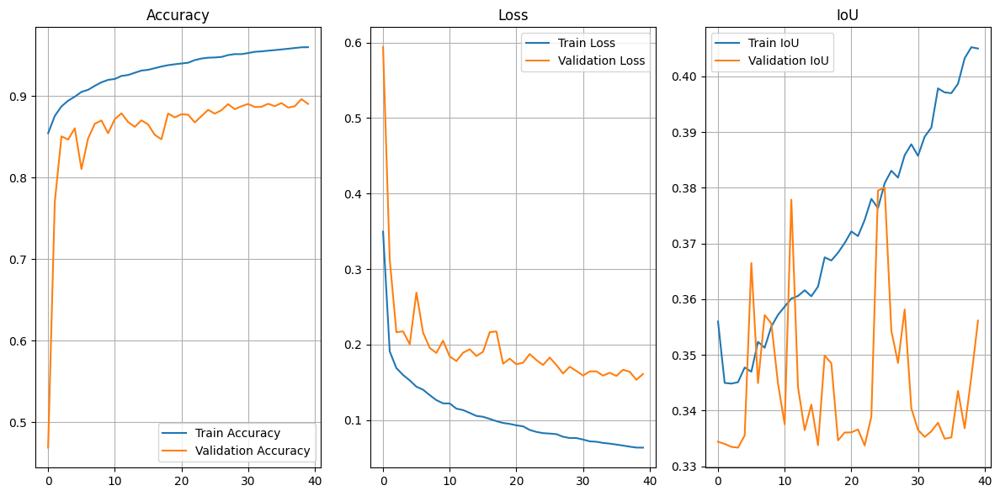

In [18]:
# Evaluate and Visualize
evaluation_results = model.evaluate(val_gen, steps=val_steps)
val_loss, val_acc, val_iou = evaluation_results[0], evaluation_results[1], evaluation_results[2]
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}, Validation IoU: {val_iou}")

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(history.history['iou'], label='Train IoU')
plt.plot(history.history['val_iou'], label='Validation IoU')
plt.legend()
plt.title('IoU')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

# Function to preprocess the input image to the correct shape
def preprocess_image(image_path, target_size=(256, 256)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image / 255.0  # Normalize the image
    return np.expand_dims(image, axis=0)  # Add batch dimension

# Function to visualize model predictions
def visualize_model_output(image_paths):
    num_images = len(image_paths)
    plt.figure(figsize=(15, num_images * 5))  # Adjust figure size based on the number of images
    
    for idx, image_path in enumerate(image_paths):
        preprocessed_image = preprocess_image(image_path)
        prediction = model.predict(preprocessed_image)[0]  # Remove batch dimension
        
        # Get the class with max probability for each pixel
        predicted_mask = np.argmax(prediction, axis=-1)
        
        # Resize the mask to original image dimensions
        original_image = cv2.imread(image_path)
        predicted_mask_resized = cv2.resize(predicted_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        # Map the classes to colors for visualization (for example, wall=1, ceiling=2, background=0)
        mask_colored = np.zeros((predicted_mask_resized.shape[0], predicted_mask_resized.shape[1], 3), dtype=np.uint8)
        mask_colored[predicted_mask_resized == 1] = [255, 0, 0]  # Blue for wall
        mask_colored[predicted_mask_resized == 2] = [0, 0, 255]  # Red for ceiling
        # mask_colored[predicted_mask_resized == 0] = [0, 255, 0]  # Green for background

        # Display original and predicted images side by side
        plt.subplot(num_images, 2, idx*2 + 1)
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Original Image {idx + 1}")
        plt.axis("off")
        
        plt.subplot(num_images, 2, idx*2 + 2)
        plt.imshow(mask_colored)
        plt.title(f"Predicted Segmentation {idx + 1}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Function to get all image files from a folder
def get_image_files_from_folder(folder_path, valid_extensions=[".jpg", ".jpeg", ".png"]):
    image_paths = []
    for filename in os.listdir(folder_path):
        if any(filename.lower().endswith(ext) for ext in valid_extensions):
            image_paths.append(os.path.join(folder_path, filename))
    return image_paths

# Folder path containing images
folder_path = r"E:\Wall_Segmentation_project\For testing the model dataset"  # Replace with the path to your folder

# Get all image paths from the folder
image_paths = get_image_files_from_folder(folder_path)

# Visualize the predictions for all images in the folder
visualize_model_output(image_paths)


INFO:tensorflow:Assets written to: C:\Users\BILALS~1\AppData\Local\Temp\tmpj1v018f2\assets


INFO:tensorflow:Assets written to: C:\Users\BILALS~1\AppData\Local\Temp\tmpj1v018f2\assets


Saved artifact at 'C:\Users\BILALS~1\AppData\Local\Temp\tmpj1v018f2'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)
Captures:
  1742803010192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803023440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803010768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803021520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803024016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803023248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803023824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803023056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803021904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1742803024976: TensorSpec(shape=(), dtype=tf.resource, name

e:\YOLO Model\venv\Lib\site-packages\tensorflow\lite\python\convert.py:983: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


TFLite model saved to YOLO_Inspired_Model.tflite


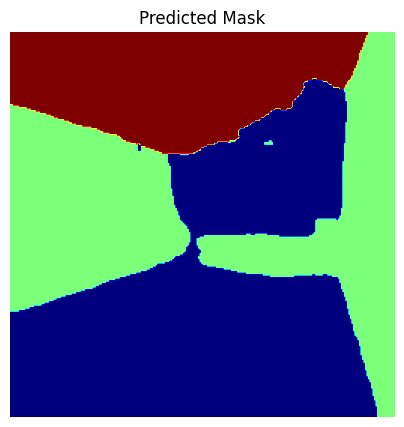

In [ ]:
# TFLite Conversion and Testing
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from tensorflow.keras.utils import register_keras_serializable
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Reshape, Multiply

# Define custom layers
@register_keras_serializable()
class SpatialDropout2D(tf.keras.layers.Layer):
    def __init__(self, rate, **kwargs):
        super(SpatialDropout2D, self).__init__(**kwargs)
        self.rate = rate

    def call(self, inputs, training=None):
        if training:
            return tf.nn.dropout(inputs, rate=self.rate, noise_shape=[tf.shape(inputs)[0], 1, 1, tf.shape(inputs)[3]])
        return inputs

    def get_config(self):
        config = super(SpatialDropout2D, self).get_config()
        config.update({'rate': self.rate})
        return config

@register_keras_serializable()
class ChannelAttention(tf.keras.layers.Layer):
    def __init__(self, ratio=8, **kwargs):
        super(ChannelAttention, self).__init__(**kwargs)
        self.ratio = ratio

    def build(self, input_shape):
        channel = input_shape[-1]
        self.shared_layer_one = Dense(channel // self.ratio, activation='relu')
        self.shared_layer_two = Dense(channel, activation='sigmoid')

    def call(self, inputs):
        avg_pool = GlobalAveragePooling2D()(inputs)
        avg_pool = Reshape((1, 1, inputs.shape[-1]))(avg_pool)
        avg_pool = self.shared_layer_one(avg_pool)
        avg_pool = self.shared_layer_two(avg_pool)
        return Multiply()([inputs, avg_pool])

    def get_config(self):
        config = super(ChannelAttention, self).get_config()
        config.update({'ratio': self.ratio})
        return config

# Define custom loss functions
@register_keras_serializable()
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

@register_keras_serializable()
def focal_loss(y_true, y_pred, gamma=2.5, alpha=0.25):
    epsilon = K.epsilon()
    y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
    loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred) - (1 - y_true) * (1 - alpha) * K.pow(y_pred, gamma) * K.log(1 - y_pred)
    return K.mean(loss)

@register_keras_serializable()
def iou_loss(y_true, y_pred):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3]) - intersection
    return 1 - K.mean((intersection + 1e-7) / (union + 1e-7))

@register_keras_serializable()
def combined_loss(y_true, y_pred):
    return 0.4 * iou_loss(y_true, y_pred) + 0.4 * dice_loss(y_true, y_pred) + 0.2 * focal_loss(y_true, y_pred)

# Load the saved Keras model
model_path = 'YOLO_Inspired_Model.keras'
model = tf.keras.models.load_model(model_path, custom_objects={
    'SpatialDropout2D': SpatialDropout2D,
    'ChannelAttention': ChannelAttention,
    'dice_loss': dice_loss,
    'focal_loss': focal_loss,
    'iou_loss': iou_loss,
    'combined_loss': combined_loss
})

# Define representative dataset for int8 quantization
val_images_dir = 'E:\\YOLO Model\\Annotated_Dataset - Copy\\validation\\images'
def representative_dataset():
    image_files = [f for f in os.listdir(val_images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for img_file in image_files[:100]:  # Use up to 100 images for calibration
        img_path = os.path.join(val_images_dir, img_file)
        image = cv2.imread(img_path)
        if image is None:
            continue
        image = cv2.resize(image, (256, 256))
        image = (image / 255.0).astype(np.float32)  # Model expects float32 input for quantization
        image = np.expand_dims(image, axis=0)
        yield [image]

def convert_to_tflite(model, output_path):
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    converter.target_spec.supported_types = [tf.int8]
    converter.inference_input_type = tf.int8
    converter.inference_output_type = tf.int8
    converter.representative_dataset = representative_dataset
    tflite_model = converter.convert()
    with open(output_path, 'wb') as f:
        f.write(tflite_model)
    print(f'TFLite model saved to {output_path}')

def test_tflite_model(tflite_path, test_image_path):
    interpreter = tf.lite.Interpreter(model_path=tflite_path)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    image = cv2.imread(test_image_path)
    image = cv2.resize(image, (256, 256))
    image = (image / 255.0 * 255).astype(np.int8)  # Quantize to int8
    image = np.expand_dims(image, axis=0)

    interpreter.set_tensor(input_details[0]['index'], image)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details[0]['index'])
    predicted_mask = np.argmax(output[0], axis=-1)

    plt.figure(figsize=(5, 5))
    plt.imshow(predicted_mask, cmap='jet')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Convert and test TFLite model
convert_to_tflite(model, 'YOLO_Inspired_Model.tflite')
test_image = os.path.join(val_images_dir, os.listdir(val_images_dir)[0])
test_tflite_model('YOLO_Inspired_Model.tflite', test_image)

Input shape expected: [  1 256 256   3]
Output shape expected: [  1 256 256   3]
Found 42 images to test in E:\YOLO Model\For testing the model dataset


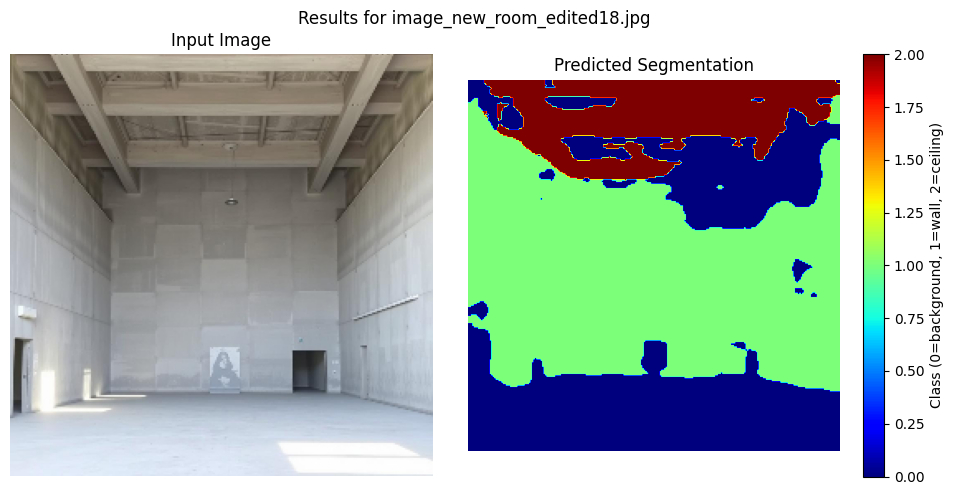

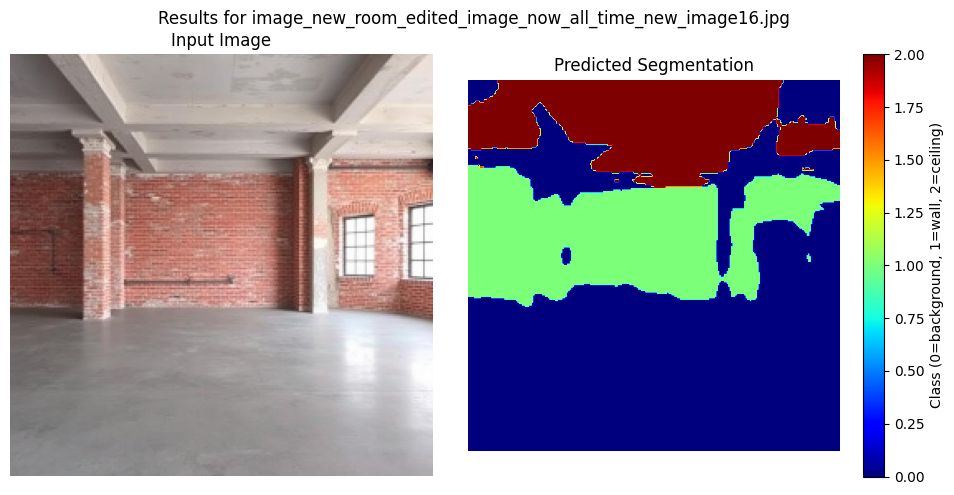

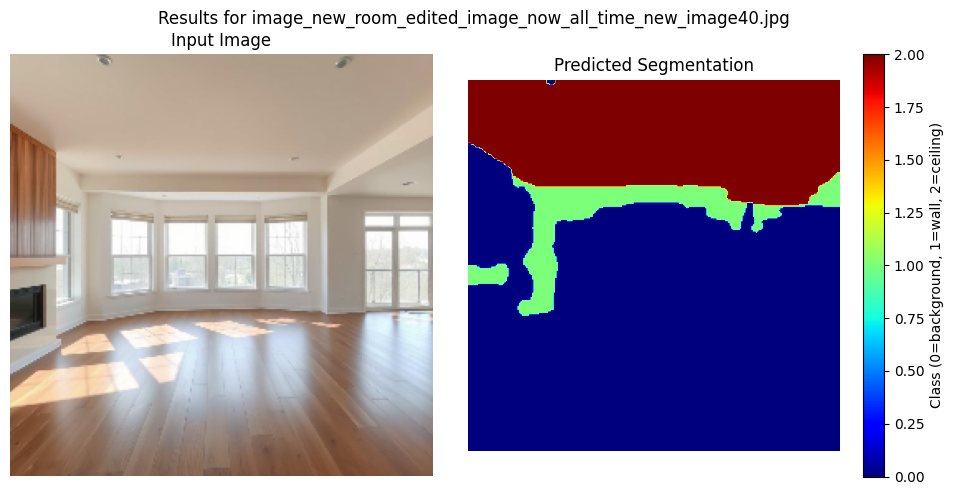

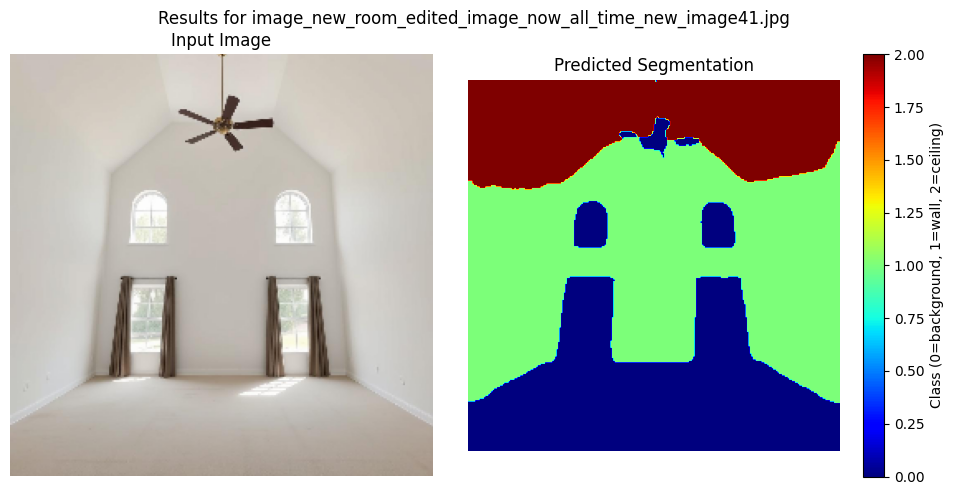

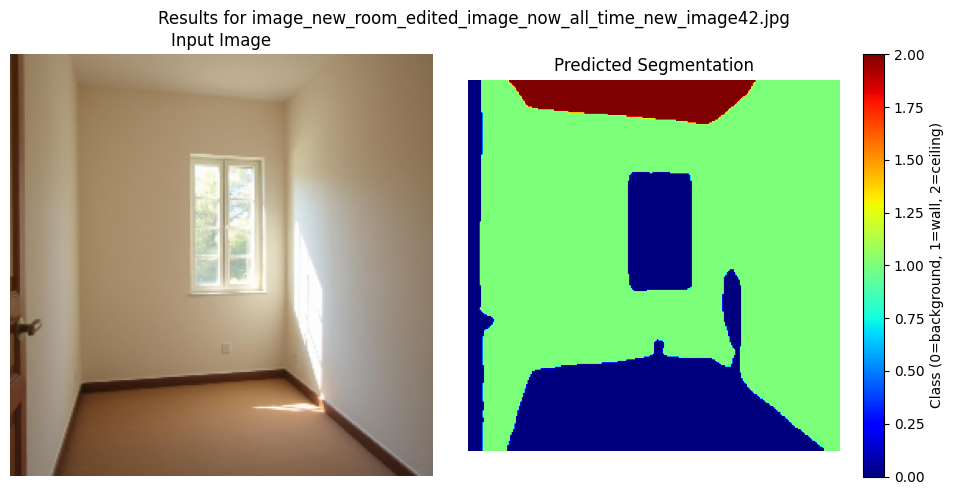

...

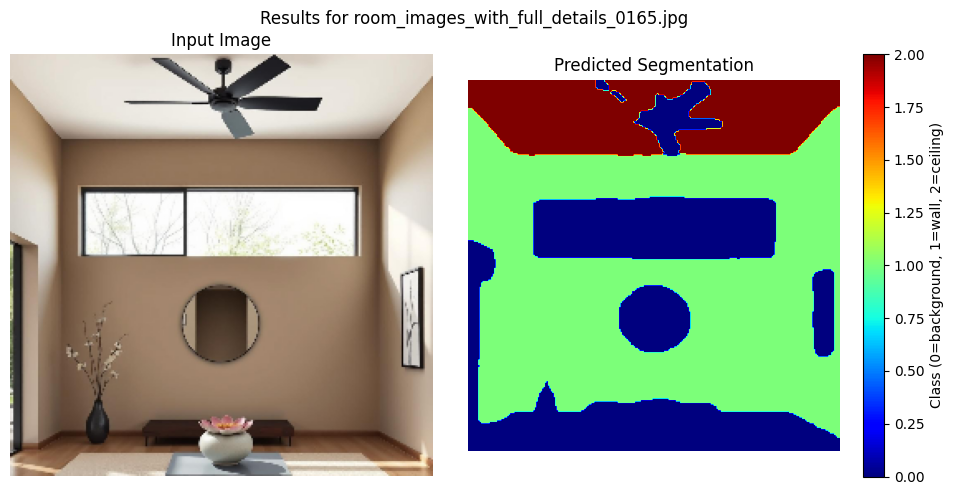

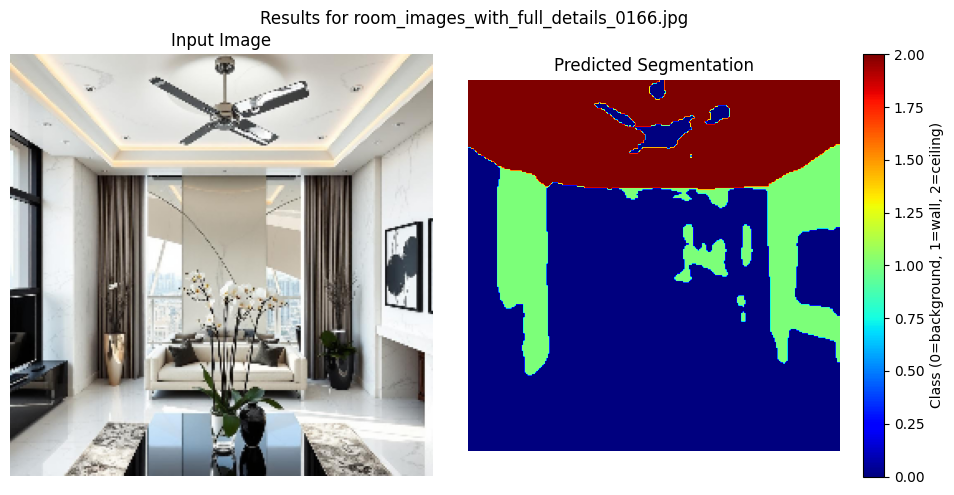

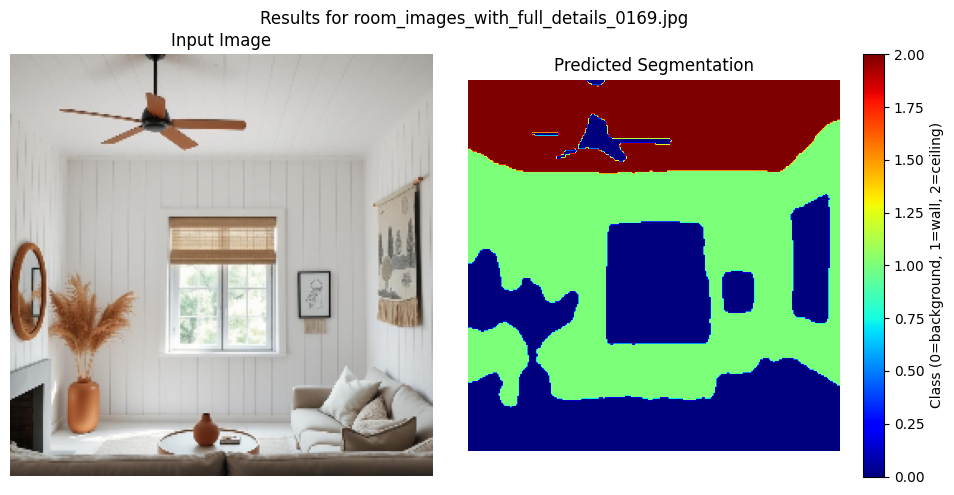

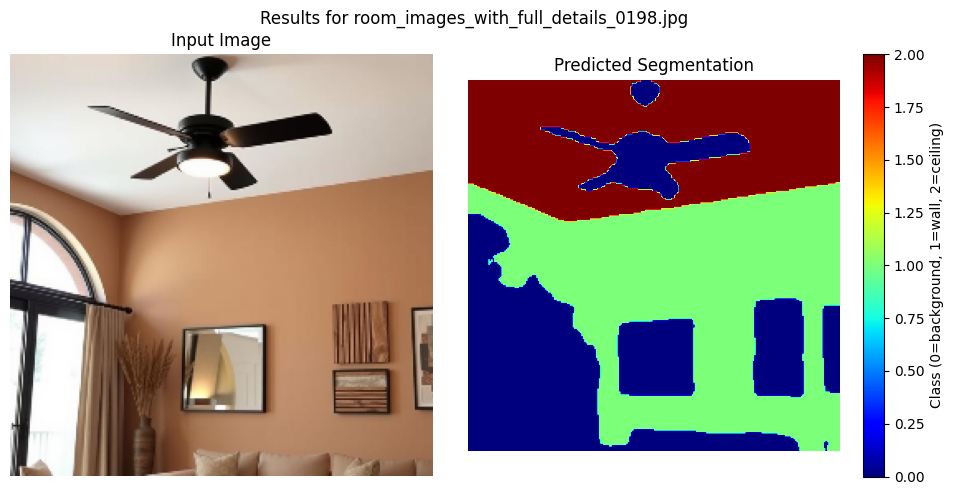

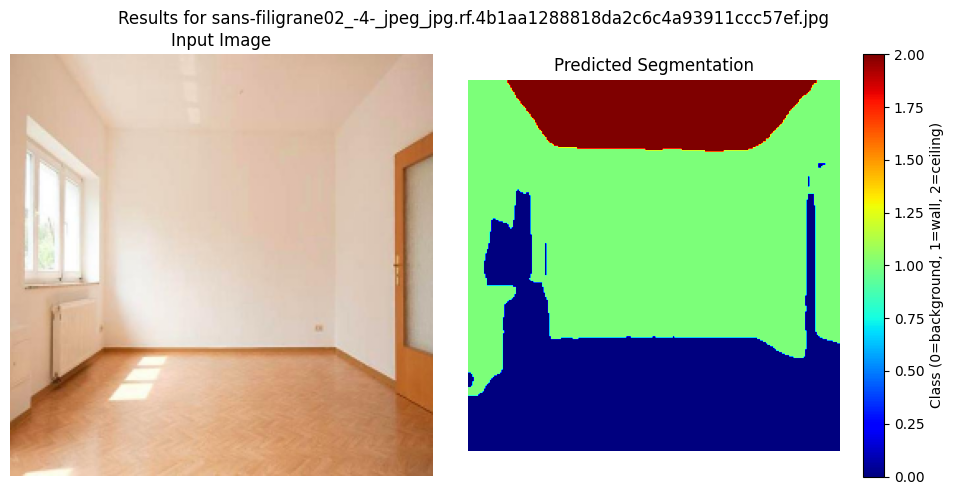

In [ ]:
# TFLite Model Testing
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import os

# Load the TFLite model and allocate tensors
interpreter = tf.lite.Interpreter(model_path='YOLO_Inspired_Model.tflite')
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Check input/output shapes
print("Input shape expected:", input_details[0]['shape'])  # Should be [1, 256, 256, 3]
print("Output shape expected:", output_details[0]['shape'])  # Should be [1, 256, 256, 3]

# Verify input type is int8
if input_details[0]['dtype'] != np.int8:
    raise ValueError(f"Expected input dtype int8, got {input_details[0]['dtype']}")

# Define the image directory
image_folder = 'E:\\YOLO Model\\For testing the model dataset'

# Get list of image files
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"Found {len(image_files)} images to test in {image_folder}")

# Process each image
for img_file in image_files:
    # Load and preprocess the test image
    test_image_path = os.path.join(image_folder, img_file)
    image = cv2.imread(test_image_path)

    # Check if image loaded successfully
    if image is None:
        print(f"Error: Could not load image from {test_image_path}. Skipping.")
        continue

    # Preprocess the image
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    image = cv2.resize(image, (256, 256))  # Resize to 256x256
    image = (image / 255.0 * 255 - 128).astype(np.int8)  # Normalize to [-128, 127] for int8
    input_data = np.expand_dims(image, axis=0)  # Add batch dimension: [1, 256, 256, 3]

    # Verify input shape
    if input_data.shape != tuple(input_details[0]['shape']):
        print(f"Error: Input shape mismatch for {img_file}. Expected {input_details[0]['shape']}, got {input_data.shape}. Skipping.")
        continue

    # Set input tensor
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])  # Shape: [1, 256, 256, 3]

    # Verify output shape
    if output_data.shape != tuple(output_details[0]['shape']):
        print(f"Error: Output shape mismatch for {img_file}. Expected {output_details[0]['shape']}, got {output_data.shape}. Skipping.")
        continue

    prediction = np.argmax(output_data[0], axis=-1)  # Convert softmax to class indices: [256, 256]

    # Visualize the result
    plt.figure(figsize=(10, 5))

    # Original image (convert back to float for visualization)
    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    plt.imshow((image.astype(np.float32) + 128) / 255.0)  # Convert int8 back to [0, 1]
    plt.axis('off')

    # Predicted segmentation mask
    plt.subplot(1, 2, 2)
    plt.title("Predicted Segmentation")
    plt.imshow(prediction, cmap='jet')  # Use 'jet' colormap for 3 classes (0, 1, 2)
    plt.colorbar(label='Class (0=background, 1=wall, 2=ceiling)')
    plt.axis('off')

    plt.suptitle(f"Results for {img_file}")
    plt.tight_layout()
    plt.show()